In [1]:
import sys
import xarray as xr
import numpy as np
import pandas as pd
import math
import glob
import yaml
import geopandas as gpd
import shapely.geometry
import cartopy
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar # different way to handle colorbar
import matplotlib.ticker as mticker
import cmocean.cm as cmo

# cartopy
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
import cartopy.feature as cfeature
import dask

# import personal modules
# Path to modules
sys.path.append('../modules')
# Import my modules
from utils import roundPartial, select_months_ds
from plotter import draw_basemap, plot_terrain, plot_arscale_cbar
from colorline import colorline

dask.config.set(**{'array.slicing.split_large_chunks': True})

ERROR 1: PROJ: proj_create_from_database: Open of /home/dnash/miniconda3/envs/SEAK-clim/share/proj failed


In [2]:
server='skyriver'
if server == 'comet':
    path_to_data = '/data/projects/Comet/cwp140/'
elif server == 'expanse':
    path_to_data = '/expanse/lustre/scratch/dnash/temp_project/'
elif server == 'skyriver':
    path_to_data = '/home/dnash/comet_data/'
path_to_out  = '../out/'       # output files (numerical results, intermediate datafiles) -- read & write
path_to_figs = '../figs/'      # figures

In [3]:
# ## Load Basin watershed file
# fp = path_to_data + 'downloads/UpperCO/Upper_Colorado_River_Basin_Boundary/Upper_Colorado_River_Basin_Boundary.shp'
# basin = gpd.read_file(fp, crs="EPSG:4326") # have to manually set the projection
# basin

# ## load the list of HUC8s in Upper Colorado River Basin
# fname = '../data/UpperColorado_HUC8s.txt'
# HUC8_lst = pd.read_csv(fname, header=None, names=['idx', 'HUC8'], sep='\s+')
# HUC8_lst = HUC8_lst.HUC8.values

In [4]:
start_mon = 1
end_mon = 12

## load PRISM watershed precip dataset
fname = path_to_data + 'preprocessed/PRISM/PRISM_HUC8_CO.nc'
PRISM = xr.open_dataset(fname)
## get just Nov - April
PRISM = select_months_ds(PRISM, start_mon, end_mon, 'date')

HUC8_lst = PRISM.HUC8.values ## get list of HUC8 IDs

## a quick function that assigns each watershed a basin value 
## based on the first 2 numbers of the HUC8 identifier

basin_lst = []
for i, HUC8_ID in enumerate(HUC8_lst):
    HUC2 = HUC8_ID[:2]
    if HUC2 == '14':
        basin = 'Colorado'
    elif HUC2 == '13':
        basin = 'Rio Grande'
    elif HUC2 == '11':
        basin = 'Arkansas'
    elif HUC2 == '10':
        basin = 'South Platte'
   
    basin_lst.append(basin)
    
ds_lst = []
for i, HUC8_ID in enumerate(HUC8_lst):
    fname = '/home/dnash/comet_data/preprocessed/ERA5_trajectories/latest/PRISM_HUC8_{0}.nc'.format(HUC8_ID)
    ds = xr.open_dataset(fname)
    ds_lst.append(ds)
    
## concat ds_lst along HUC8 index
ds = xr.concat(ds_lst, pd.Index(HUC8_lst, name="HUC8"))
## add the basin name as a coord
ds = ds.assign_coords({'basin': ("HUC8", basin_lst)})
ds

In [11]:
ds_NDJFMA = select_months_ds(ds, 11, 4, 'start_date')
ds_MJJASO = select_months_ds(ds, 5, 10, 'start_date')

ds_lst = [ds_NDJFMA, ds_MJJASO]

ds_DJF = select_months_ds(ds, 12, 2, 'start_date')
ds_MAM = select_months_ds(ds, 3, 5, 'start_date')
ds_JJA = select_months_ds(ds, 6, 8, 'start_date')
ds_SON = select_months_ds(ds, 9, 11, 'start_date')

ds_lst2 = [ds_DJF, ds_MAM, ds_JJA, ds_SON]

In [12]:
ssn_lst = ['NDJFMA', 'MJJASON']
basin_lst = ['Colorado', 'Rio Grande', 'South Platte', 'Arkansas']

for i, ssn in enumerate(ssn_lst):
    for j, basin in enumerate(basin_lst):
        print(ssn, basin)
        print(i, j)

NDJFMA Colorado
0 0
NDJFMA Rio Grande
0 1
NDJFMA South Platte
0 2
NDJFMA Arkansas
0 3
MJJASON Colorado
1 0
MJJASON Rio Grande
1 1
MJJASON South Platte
1 2
MJJASON Arkansas
1 3


NDJFMA Colorado
NDJFMA Rio Grande
NDJFMA South Platte
NDJFMA Arkansas
MJJASO Colorado
MJJASO Rio Grande
MJJASO South Platte
MJJASO Arkansas


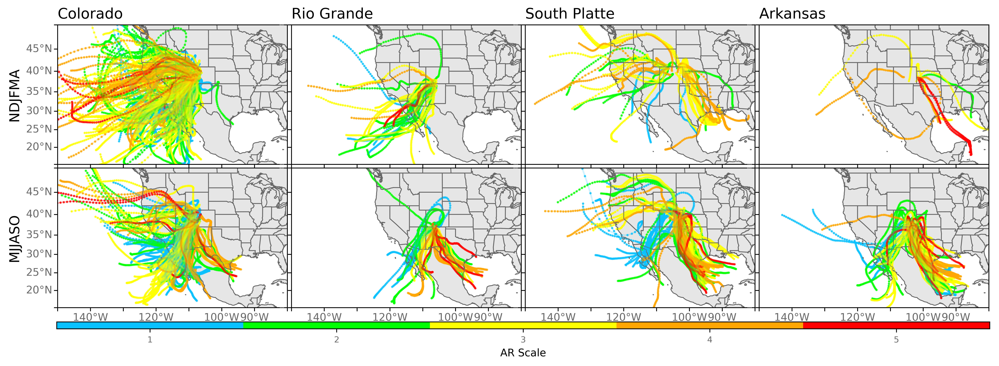

In [21]:
nrows = 4
ncols = 4

# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.Mercator() ## the projection you want your map displayed in

ext = [-150., -80., 15., 50.] 

# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 0.05, 0.05], width_ratios = [1, 1, 1, 1], wspace=0.01, hspace=0.05)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(16.0, 5.25))
fig.dpi = 600
fname = path_to_figs + 'ARScale_basin_WY'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################
plt_lbl = ['NDJFMA', 'MJJASO']
colors = ['#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
left_lats = [True, False, False, False]
bottom_lons = [False, True]
ssn_lst = ['NDJFMA', 'MJJASO']
basin_lst = ['Colorado', 'Rio Grande', 'South Platte', 'Arkansas']

for i, ssn in enumerate(ssn_lst):
    for j, basin_name in enumerate(basin_lst):
        print(ssn, basin_name)
        ax = fig.add_subplot(gs[i, j], projection=mapcrs)
        ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=left_lats[j], right_lats=False, bottom_lons=bottom_lons[i])
        ax.set_extent(ext, datacrs)
        ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
        
        if i == 0: # add column label to top row only
            ax.set_title(basin_name, loc='left', fontsize=14)
        
        if j == 0: # add row labels to the far left plot
            ax.text(-0.16, 0.5, ssn_lst[i], va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)
    
        ds = ds_lst[i].where(ds_lst[i].basin==basin_name)
        ## Loop through AR scale values
        for k in range(1, 6):
            try:
                AR = ds.where(ds.ar_scale == k, drop=True)
                for l, HUC8 in enumerate(AR.HUC8.values):
                    tmp = AR.sel(HUC8=HUC8)
                    tmp = tmp.where(tmp.ar_scale == k, drop=True)
                    nevents = len(tmp.start_date)
                    ## LOOP THROUGH TRAJECTORIES
                    for m in range(nevents):
                        data =tmp.isel(start_date=m)
                        y_lst = data.lat.values
                        x_lst = data.lon.values
                        ax.plot(x_lst, y_lst, c=colors[k-1], transform=datacrs, alpha=0.2)
                        cf = ax.scatter(x_lst, y_lst, c=colors[k-1], marker='.', transform=datacrs, alpha=0.7, s=6)
            except IndexError:
                pass

# # Add color bar
cbax = plt.subplot(gs[-1,:]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

DJF Colorado
DJF Rio Grande
DJF South Platte
DJF Arkansas
MAM Colorado
MAM Rio Grande
MAM South Platte
MAM Arkansas
JJA Colorado
JJA Rio Grande
JJA South Platte
JJA Arkansas
SON Colorado
SON Rio Grande
SON South Platte
SON Arkansas


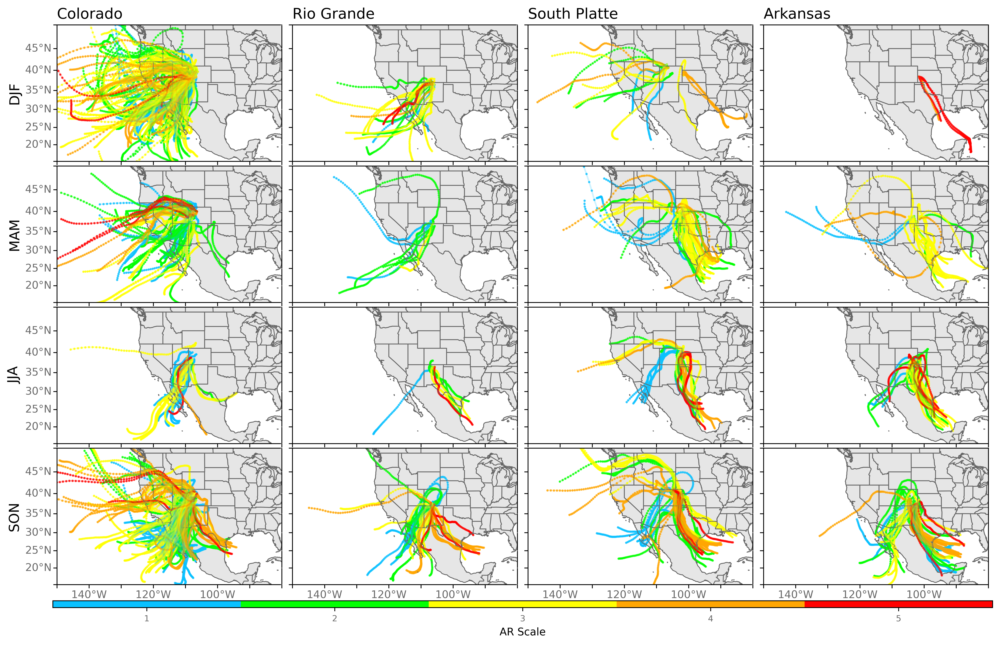

In [22]:
nrows = 6
ncols = 4

# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.Mercator() ## the projection you want your map displayed in

ext = [-150., -80., 15., 50.] 

# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 1, 1, 0.05, 0.05], width_ratios = [1, 1, 1, 1], wspace=0.01, hspace=0.05)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(16.0, 10.0))
fig.dpi = 600
fname = path_to_figs + 'ARScale_basin_SSN'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################
plt_lbl = ['DJF', 'MAM', 'JJA', 'SON']
colors = ['#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
left_lats = [True, False, False, False]
bottom_lons = [False, False, False, True]
ssn_lst = ['DJF', 'MAM', 'JJA', 'SON']
basin_lst = ['Colorado', 'Rio Grande', 'South Platte', 'Arkansas']

for i, ssn in enumerate(ssn_lst):
    for j, basin_name in enumerate(basin_lst):
        print(ssn, basin_name)
        ax = fig.add_subplot(gs[i, j], projection=mapcrs)
        ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=left_lats[j], right_lats=False, bottom_lons=bottom_lons[i])
        ax.set_extent(ext, datacrs)
        ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
        
        if i == 0: # add column label to top row only
            ax.set_title(basin_name, loc='left', fontsize=14)
        
        if j == 0: # add row labels to the far left plot
            ax.text(-0.16, 0.5, ssn_lst[i], va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)
    
        ds = ds_lst2[i].where(ds_lst2[i].basin==basin_name)
        ## Loop through AR scale values
        for k in range(1, 6):
            try:
                AR = ds.where(ds.ar_scale == k, drop=True)
                for l, HUC8 in enumerate(AR.HUC8.values):
                    tmp = AR.sel(HUC8=HUC8)
                    tmp = tmp.where(tmp.ar_scale == k, drop=True)
                    nevents = len(tmp.start_date)
                    ## LOOP THROUGH TRAJECTORIES
                    for m in range(nevents):
                        data =tmp.isel(start_date=m)
                        y_lst = data.lat.values
                        x_lst = data.lon.values
                        ax.plot(x_lst, y_lst, c=colors[k-1], transform=datacrs, alpha=0.2)
                        cf = ax.scatter(x_lst, y_lst, c=colors[k-1], marker='.', transform=datacrs, alpha=0.7, s=6)
            except IndexError:
                pass

# # Add color bar
cbax = plt.subplot(gs[-1,:]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()